# On-chain Data Wrangling

This notebook uses **CryptoDataPy** to collect, clean and wrangle on-chain data necessary to analyze digital assets.

# Data Collection

We will be using **CryptoDataPy**, a python library we have created to make the process of analyzing digital assets as easy as possible. It allows you to create high quality ready-for-analysis data sets from a variety of sources with only a few lines of code. For more information, see our docs: https://cryptodatapy.readthedocs.io/en/latest/#

<br>

Our data set will be collected from the following sources: CryptoCompare, CoinMetrics and Glassnode.

**On-chain data:**

- *Transactions:* total on-chain transaction value (volumes), transaction count and mean transaction value.
- *Addresses:* the number of unique active addresses, new addresses and total addresses.
- *Supply:* circulating supply.
- *Computing power:* hashrate and diffculty.

<br>

**Note:** we recommend following the instructions carefully to avoid hitting web API rate limits. Alternatively, those paying for premium packages from any of our data sources can include their API keys to remove rate limit restrictions on freemium offerings. See CryptoDataPy docs for more information on specifying the API key parameter.

## Market Data

In [13]:
import pandas as pd
import numpy as np
from time import sleep
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

from cryptodatapy.util.datacatalog import DataCatalog 
from cryptodatapy.extract.datarequest import DataRequest
from cryptodatapy.extract.getdata import GetData
from cryptodatapy.transform.clean import CleanData

### Asset Universe

Since factor-based strategies are implemented with long/short positions, we restrict our asset universe to liquid assets trading on the Binance perpetual futures exchange which includes ~ 150 assets.

Our universe is filtered down futher to assets with spot prices that go further back to increase our sample size and the statistical/economic significance of our results.

To do this, we find the intersection of assets with perpetual futures and spot traded on Binance as well as CryptoCompare's aggregated exchange for extended backhistory.

In [14]:
# get all Binance perp futures tickers from CCXT
data_req = DataRequest(source='ccxt')
fut_tickers = GetData(data_req).get_meta(method='get_markets_info', exch='binanceusdm', as_list=True)

In [15]:
# get all Binance spot tickers from CCXT
data_req = DataRequest(source='ccxt')
spot_tickers = GetData(data_req).get_meta(method='get_markets_info', exch='binance', as_list=True)

In [16]:
# find tickers intersection
binance_tickers = [ticker for ticker in fut_tickers if ticker in spot_tickers]

In [17]:
# keep only USDT tickers from Binance
bin_tickers = []
for ticker in binance_tickers:
    if '/' in ticker and ticker.split('/')[1] == 'USDT':
        bin_tickers.append(ticker.split('/')[0])

In [18]:
# get spot tickers from cryptocompare 
data_req = DataRequest(source='cryptocompare')
cc_tickers = GetData(data_req).get_meta(method='get_assets_info', as_list=True)

In [19]:
# find intersecting tickers for Binance and CryptoCompare
tickers = [ticker for ticker in bin_tickers if ticker in cc_tickers]

In [20]:
# remove FTT and SRM
tickers = [ticker for ticker in tickers if ticker not in ['FTT', 'SRM']]

### Stablecoins

Many data sources will return on-chain data for stablecoins which may not be of interest to us in this case.

**CryptoDataPy** allows us to pull a list of stablecoins in order to remove those assets from our analysis.

In [21]:
# get stablecoin list
dc = DataCatalog()
sc_list = dc.get_tickers_metadata(cat='crypto').index.to_list()

## On-chain Data

We retrieve on-chain data from CryptoCompare, CoinMetrics and Glassnode using **CryptoDataPy**.

Again, we will break up ticker and fields into batches and restrict API calls to below 30 per minute to avoid hitting rate limits.

### Transactions

- Transaction (transfer) value mean USD and counts from CoinMetrics

In [22]:
cm_tx_fields = ['tx_count', 'tfr_count', 'tfr_val_mean_usd']

In [23]:
data_req = DataRequest(source='coinmetrics', fields=cm_tx_fields)
cm_tx_val_tickers = GetData(data_req).get_meta(method='get_onchain_tickers_list', data_req=data_req)

In [24]:
cm_tx_val_tickers = [ticker for ticker in cm_tx_val_tickers if ticker.split('_')[0].upper() not in sc_list]
cm_tx_val_tickers = [ticker for ticker in cm_tx_val_tickers if ticker.split('_')[0].upper() in tickers]

In [25]:
len(cm_tx_val_tickers)

47

In [26]:
# split tx tickers list into 2 batchs to avoid going over rate limit
cm_tx_val_tickers1 = cm_tx_val_tickers[:23]
cm_tx_val_tickers2 = cm_tx_val_tickers[23:]

In [27]:
# pull first batch
data_req = DataRequest(source='coinmetrics', tickers=cm_tx_val_tickers1, fields=cm_tx_fields)
cm_tx_val_df1 = GetData(data_req).get_series()
sleep(60)

In [28]:
# pull second batch
data_req = DataRequest(source='coinmetrics', tickers=cm_tx_val_tickers2, fields=cm_tx_fields)
cm_tx_val_df2 = GetData(data_req).get_series()
sleep(60)

In [29]:
cm_tx_val_df = pd.concat([cm_tx_val_df1, cm_tx_val_df2]).sort_index()

In [30]:
# remove '_' from tickers
cm_tx_val_df.reset_index(inplace=True)
cm_tx_val_df.ticker = cm_tx_val_df.ticker.str.split('_').str[0]
# reset index
cm_tx_val_df.set_index(['date', 'ticker'], inplace=True)
# drop dups
cm_tx_val_df = cm_tx_val_df[~cm_tx_val_df.index.duplicated()]

In [31]:
# compute tfr val
cm_tx_val_df['tfr_val_usd'] = cm_tx_val_df.tfr_val_mean_usd * cm_tx_val_df.tfr_count

- Transaction (transfer) value usd (total), transaction value mean and transaction/transfer counts from Glassnode.

In [33]:
# filter tickers list for gn
data_req = DataRequest(source='glassnode')
gn_avail_tickers = GetData(data_req).get_meta(attr='assets')

In [34]:
gn_tickers = [ticker for ticker in gn_avail_tickers if ticker in tickers]

In [35]:
len(gn_tickers)

36

In [36]:
#  split gn tickers into batches
gn_tickers1 = gn_tickers[:5]
gn_tickers2 = gn_tickers[5:10]
gn_tickers3 = gn_tickers[10:15]
gn_tickers4 = gn_tickers[15:20]
gn_tickers5 = gn_tickers[15:20]
gn_tickers6 = gn_tickers[20:25]
gn_tickers7 = gn_tickers[25:30]
gn_tickers8 = gn_tickers[30:36]

In [37]:
# pull batch 
data_req = DataRequest(source='glassnode', tickers=gn_tickers1, fields=['tfr_val', 'tfr_val_mean', 'tfr_count', 'tx_count'])
gn_tx_val_df1 = GetData(data_req).get_series()
sleep(60)

In [38]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='USD', tickers=gn_tickers2, fields=['tfr_val', 'tfr_val_mean', 'tfr_count', 'tx_count'])
gn_tx_val_df2 = GetData(data_req).get_series()
sleep(60)

In [39]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='USD', tickers=gn_tickers3, fields=['tfr_val', 'tfr_val_mean', 'tfr_count', 'tx_count'])
gn_tx_val_df3 = GetData(data_req).get_series()
sleep(60)

In [40]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='USD', tickers=gn_tickers4, fields=['tfr_val', 'tfr_val_mean', 'tfr_count', 'tx_count'])
gn_tx_val_df4 = GetData(data_req).get_series()
sleep(60)

In [41]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='USD', tickers=gn_tickers5, fields=['tfr_val', 'tfr_val_mean', 'tfr_count', 'tx_count'])
gn_tx_val_df5 = GetData(data_req).get_series()
sleep(60)

In [42]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='USD', tickers=gn_tickers6, fields=['tfr_val', 'tfr_val_mean', 'tfr_count', 'tx_count'])
gn_tx_val_df6 = GetData(data_req).get_series()
sleep(60)

In [43]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='USD', tickers=gn_tickers7, fields=['tfr_val', 'tfr_val_mean', 'tfr_count', 'tx_count'])
gn_tx_val_df7 = GetData(data_req).get_series()
sleep(60)

In [44]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='USD', tickers=gn_tickers8, fields=['tfr_val', 'tfr_val_mean', 'tfr_count', 'tx_count'])
gn_tx_val_df8 = GetData(data_req).get_series()
sleep(60)

In [45]:
gn_tx_val_df = pd.concat([gn_tx_val_df1, gn_tx_val_df2, gn_tx_val_df3, gn_tx_val_df4, 
                          gn_tx_val_df5, gn_tx_val_df6, gn_tx_val_df7, gn_tx_val_df8]).sort_index()

In [46]:
gn_tx_val_df.head()

,,tfr_val,tfr_val_mean,tfr_count,tx_count
date,ticker,,,,
2009-01-12,BTC,<NA>,<NA>,<NA>,7
2009-01-14,BTC,<NA>,<NA>,<NA>,1
2009-01-15,BTC,<NA>,<NA>,<NA>,8
2009-01-16,BTC,<NA>,<NA>,<NA>,2
2009-01-18,BTC,<NA>,<NA>,<NA>,1


### Addresses

We can retrieve address data from CryptoCompare, CoinMetrics and Glassnode using **CryptoDataPy**.

We break up ticker and fields into batches and restrict API calls to below 30 per minute to avoid hitting rate limits.

- Active addresses, new addresses and total addresses from CryptoCompare

In [47]:
add_fields = ['add_act', 'add_new', 'add_tot']

In [48]:
# pull data
data_req = DataRequest(source='cryptocompare', tickers=tickers, fields=add_fields)
cc_add_df = GetData(data_req).get_series()

- Active addresses from CoinMetrics

In [49]:
data_req = DataRequest(source='coinmetrics', fields='add_act')
cm_add_tickers = GetData(data_req).get_meta(method='get_onchain_tickers_list', data_req=data_req)

In [50]:
cm_add_tickers = [ticker for ticker in cm_add_tickers if ticker.split('_')[0].upper() not in sc_list]
cm_add_tickers = [ticker for ticker in cm_add_tickers if ticker.split('_')[0].upper() in tickers]

In [51]:
len(cm_add_tickers)

47

In [52]:
# split add tickers list into 2 batchs to avoid going over rate limit
cm_add_tickers1 = cm_add_tickers[:23]
cm_add_tickers2 = cm_add_tickers[23:]

In [53]:
# pull first batch
data_req = DataRequest(source='coinmetrics', tickers=cm_add_tickers1, fields='add_act')
cm_add_df1 = GetData(data_req).get_series()
sleep(60)

In [54]:
# pull first batch
data_req = DataRequest(source='coinmetrics', tickers=cm_add_tickers2, fields='add_act')
cm_add_df2 = GetData(data_req).get_series()
sleep(60)

In [55]:
cm_add_df = pd.concat([cm_add_df1, cm_add_df2]).sort_index()

In [56]:
# remove '_' from tickers
cm_add_df.reset_index(inplace=True)
cm_add_df.ticker = cm_add_df.ticker.str.split('_').str[0]
# reset index
cm_add_df.set_index(['date', 'ticker'], inplace=True)
# drop dups
cm_add_df = cm_add_df[~cm_add_df.index.duplicated()]

In [57]:
cm_add_df.head()

,,add_act
date,ticker,
2009-01-09,BTC,19
2009-01-10,BTC,61
2009-01-11,BTC,95
2009-01-12,BTC,101
2009-01-13,BTC,123


- Active addresses, new addresses and total addresses from Glassnode

In [58]:
# pull batch 
data_req = DataRequest(source='glassnode', tickers=gn_tickers1, fields=add_fields)
gn_add_df1 = GetData(data_req).get_series()
sleep(60)

In [59]:
# pull batch 
data_req = DataRequest(source='glassnode', tickers=gn_tickers2, fields=add_fields)
gn_add_df2 = GetData(data_req).get_series()
sleep(60)

In [60]:
# pull batch 
data_req = DataRequest(source='glassnode', tickers=gn_tickers3, fields=add_fields)
gn_add_df3 = GetData(data_req).get_series()
sleep(60)

In [61]:
# pull batch 
data_req = DataRequest(source='glassnode', tickers=gn_tickers4, fields=add_fields)
gn_add_df4 = GetData(data_req).get_series()
sleep(60)

In [62]:
# pull batch 
data_req = DataRequest(source='glassnode', tickers=gn_tickers5, fields=add_fields)
gn_add_df5 = GetData(data_req).get_series()
sleep(60)

In [63]:
# pull batch 
data_req = DataRequest(source='glassnode', tickers=gn_tickers6, fields=add_fields)
gn_add_df6 = GetData(data_req).get_series()
sleep(60)

In [64]:
# pull batch 
data_req = DataRequest(source='glassnode', tickers=gn_tickers7, fields=add_fields)
gn_add_df7 = GetData(data_req).get_series()
sleep(60)

In [65]:
# pull batch 
data_req = DataRequest(source='glassnode', tickers=gn_tickers8, fields=add_fields)
gn_add_df8 = GetData(data_req).get_series()
sleep(60)

In [66]:
# concat batches
gn_add_df = pd.concat([gn_add_df1, gn_add_df2, gn_add_df3, gn_add_df4, 
                          gn_add_df5, gn_add_df6, gn_add_df7, gn_add_df8]).sort_index()

In [67]:
gn_add_df.head()

,,add_act,add_new,add_tot
date,ticker,,,
2009-01-03,BTC,<NA>,1,1
2009-01-04,BTC,<NA>,<NA>,1
2009-01-05,BTC,<NA>,<NA>,1
2009-01-06,BTC,<NA>,<NA>,1
2009-01-07,BTC,<NA>,<NA>,1


### Supply

- Circulating supply from CryptoCompare

In [68]:
data_req = DataRequest(source='cryptocompare', tickers=tickers, fields='supply_circ')
cc_supply_df = GetData(data_req).get_series()

In [69]:
cc_supply_df.head()

,,supply_circ
date,ticker,
2009-01-03,BTC,50.0
2009-01-04,BTC,50.0
2009-01-05,BTC,50.0
2009-01-06,BTC,50.0
2009-01-07,BTC,50.0


- Circulating supply from CoinMetrics

In [70]:
# get available tickers for market cap from CoinMetrics
data_req = DataRequest(source='coinmetrics', fields='supply_circ')
cm_supply_tickers = GetData(data_req).get_meta(method='get_onchain_tickers_list', data_req=data_req)

In [71]:
cm_supply_tickers = [ticker for ticker in cm_supply_tickers if ticker.split('_')[0].upper() not in sc_list]
cm_supply_tickers = [ticker for ticker in cm_supply_tickers if ticker.split('_')[0].upper() in tickers]

In [72]:
len(cm_supply_tickers)

47

In [73]:
# split tickers list into batches to avoid going over rate limit
cm_supply_tickers1 = cm_supply_tickers[:23]
cm_supply_tickers2 = cm_supply_tickers[23:]

In [74]:
# pull batch
data_req = DataRequest(source='coinmetrics', tickers=cm_supply_tickers1, fields='supply_circ')
cm_supply_df1 = GetData(data_req).get_series()
sleep(10)

In [75]:
# pull batch
data_req = DataRequest(source='coinmetrics', tickers=cm_supply_tickers2, fields='supply_circ')
cm_supply_df2 = GetData(data_req).get_series()
sleep(10)

In [76]:
cm_supply_df = pd.concat([cm_supply_df1, cm_supply_df2]).sort_index()

In [77]:
# remove '_' from tickers
cm_supply_df.reset_index(inplace=True)
cm_supply_df.ticker = cm_supply_df.ticker.str.split('_').str[0]
# reset index
cm_supply_df.set_index(['date', 'ticker'], inplace=True)
# drop dups
cm_supply_df = cm_supply_df[~cm_supply_df.index.duplicated()]

- Circulating supply from Glassnode

In [78]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='NATIVE', tickers=gn_tickers1, fields='supply_circ')
gn_supply_df1 = GetData(data_req).get_series()
sleep(60)

In [79]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='NATIVE', tickers=gn_tickers2, fields='supply_circ')
gn_supply_df2 = GetData(data_req).get_series()
sleep(60)

In [80]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='NATIVE', tickers=gn_tickers3, fields='supply_circ')
gn_supply_df3 = GetData(data_req).get_series()
sleep(60)

In [81]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='NATIVE', tickers=gn_tickers4, fields='supply_circ')
gn_supply_df4 = GetData(data_req).get_series()
sleep(60)

In [82]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='NATIVE', tickers=gn_tickers5, fields='supply_circ')
gn_supply_df5 = GetData(data_req).get_series()
sleep(60)

In [83]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='NATIVE', tickers=gn_tickers6, fields='supply_circ')
gn_supply_df6 = GetData(data_req).get_series()
sleep(60)

In [84]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='NATIVE', tickers=gn_tickers7, fields='supply_circ')
gn_supply_df7 = GetData(data_req).get_series()
sleep(60)

In [85]:
# pull batch 
data_req = DataRequest(source='glassnode', quote_ccy='NATIVE', tickers=gn_tickers8, fields='supply_circ')
gn_supply_df8 = GetData(data_req).get_series()
sleep(60)

In [86]:
# concat batches
gn_supply_df = pd.concat([gn_supply_df1, gn_supply_df2, gn_supply_df3, gn_supply_df4, 
                          gn_supply_df5, gn_supply_df6, gn_supply_df7, gn_supply_df8]).sort_index()

In [87]:
gn_supply_df.head()

,,supply_circ
date,ticker,
2009-01-03,BTC,50.0
2009-01-04,BTC,50.0
2009-01-05,BTC,50.0
2009-01-06,BTC,50.0
2009-01-07,BTC,50.0


### Computing Power

We can retrieve computing power data from CryptoCompare, CoinMetrics and Glassnode using **CryptoDataPy**.

Again, we break up ticker and fields into batches and restrict API calls to below 30 per minute to avoid hitting rate limits.

- Hashrate and mining difficulty (mean) from CryptoCompare

In [88]:
data_req = DataRequest(source='cryptocompare', tickers=tickers, fields=['hashrate', 'diff_mean'])
cc_cp_df = GetData(data_req).get_series() 

In [89]:
cc_cp_df.head()

,,hashrate,diff_mean
date,ticker,,
2009-01-03,BTC,<NA>,1.0
2009-01-04,BTC,<NA>,<NA>
2009-01-05,BTC,<NA>,<NA>
2009-01-06,BTC,<NA>,<NA>
2009-01-07,BTC,<NA>,<NA>


- Hashrate and mining difficulty (mean) from CoinMetrics

In [90]:
# get available tickers 
data_req = DataRequest(source='coinmetrics', fields=['hashrate', 'diff_mean'])
cm_cp_tickers = GetData(data_req).get_meta(method='get_onchain_tickers_list', data_req=data_req)

In [91]:
cm_cp_tickers = [ticker for ticker in cm_cp_tickers if ticker.split('_')[0].upper() not in sc_list]
cm_cp_tickers = [ticker for ticker in cm_cp_tickers if ticker.split('_')[0].upper() in tickers]

In [92]:
len(cm_cp_tickers)

9

In [93]:
data_req = DataRequest(source='coinmetrics', tickers=cm_cp_tickers, fields=['hashrate', 'diff_mean'])
cm_cp_df = GetData(data_req).get_series()

In [94]:
cm_cp_df.head()

,,hashrate,diff_mean
date,ticker,,
2009-01-09,BTC,0.000001,1.0
2009-01-10,BTC,0.000003,1.0
2009-01-11,BTC,0.000005,1.0
2009-01-12,BTC,0.000005,1.0
2009-01-13,BTC,0.000006,1.0


- Hashrate and mining difficulty (mean) from Glassnode

In [95]:
data_req = DataRequest(source='glassnode', tickers=gn_tickers1, fields=['hashrate'])
gn_cp_df = GetData(data_req).get_series()

In [96]:
gn_cp_df.head()

,,hashrate
date,ticker,
2009-01-09,BTC,128185.020474
2009-01-10,BTC,1676937.683178
2009-01-11,BTC,4679435.777458
2009-01-12,BTC,4653054.489362
2009-01-13,BTC,6070590.273928


# Data Cleaning

### Addresses: 

- Clean addresses data

In [97]:
# concat into one dataframe
add_df = pd.concat([gn_add_df, cm_add_df, cc_add_df])

In [98]:
# drop duplicates
add_df = add_df[~ add_df.index.duplicated()]

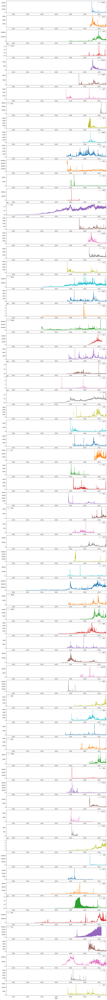

In [99]:
add_df.add_act.unstack().plot(subplots=True, sharex=False, figsize=(15,150));

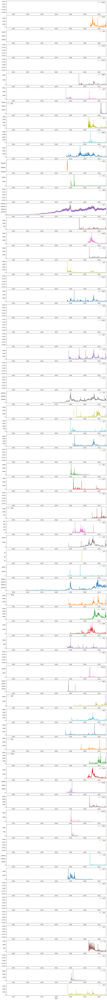

In [100]:
add_df.add_new.unstack().plot(subplots=True, sharex=False, figsize=(15,150));

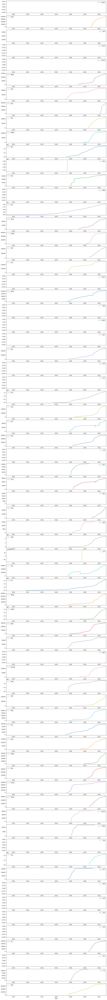

In [101]:
add_df.add_tot.unstack().plot(subplots=True, sharex=False, figsize=(15,150));

In [102]:
# clean addresses
clean_add_df = CleanData(add_df).filter_outliers(od_method='stl', thresh_val=5).\
                   repair_outliers(imp_method='interpolate').get(attr='df')

In [103]:
# tickers with bad/missing values
bad_tickers = ['BNB', 'BCH', 'DOT', 'IOST', 'LINA', 'LPT', 'THETA', 'TOMO', 'VET', 'XLM', 'XTZ', 'ZIL']

In [104]:
# drop 1INCH, BNB, XLM, XTZ, ZIL
clean_add_df = clean_add_df.drop(bad_tickers, level=1, axis=0)

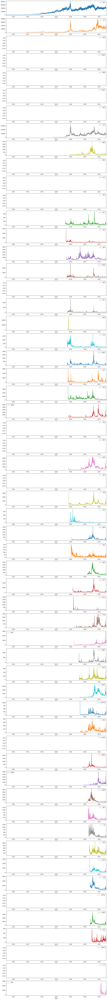

In [105]:
clean_add_df.add_new.unstack().plot(subplots=True, sharex=False, figsize=(15,150));

In [106]:
len(add_df.index.get_level_values(1).unique())

69

### Transactions: 

- Clean transactions data

In [107]:
# rename gn cols
gn_tx_val_df.columns = ['tfr_val_usd', 'tfr_val_mean_usd', 'tfr_count', 'tx_count']

In [108]:
# concat into one dataframe
tx_df = pd.concat([gn_tx_val_df, cm_tx_val_df])

In [109]:
# drop duplicates
tx_df = tx_df[~ tx_df.index.duplicated()]

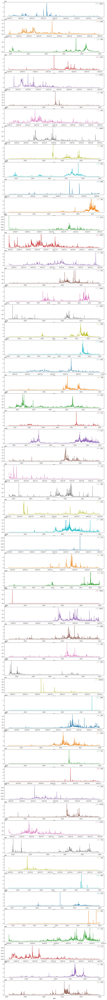

In [110]:
tx_df.tfr_val_usd.unstack().plot(subplots=True, sharex=False, figsize=(15,150));

In [111]:
# clean transactions
clean_tx_df = CleanData(tx_df).filter_outliers(od_method='stl', thresh_val=5).\
                   repair_outliers(imp_method='interpolate').get(attr='df')

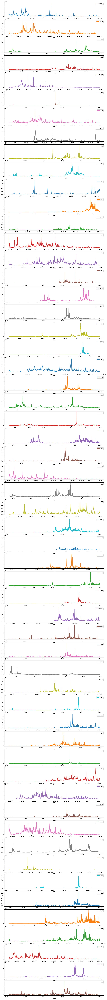

In [112]:
clean_tx_df.tfr_val_usd.unstack().plot(subplots=True, sharex=False, figsize=(15,150));

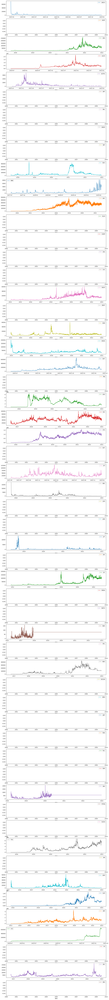

In [113]:
clean_tx_df.tx_count.unstack().plot(subplots=True, sharex=False, figsize=(15,150));

In [114]:
len(tx_df.index.get_level_values(1).unique())

56

### Supply: 

- Clean supply data

In [115]:
# concat into one dataframe
sup_df = pd.concat([gn_supply_df, cm_supply_df, cc_supply_df]).dropna(how='all')

In [116]:
# drop duplicates
sup_df = sup_df[~ sup_df.index.duplicated()]

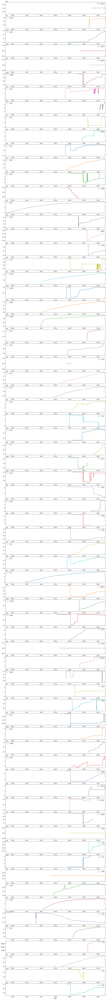

In [117]:
sup_df.supply_circ.unstack().plot(subplots=True, sharex=False, figsize=(15,150));

In [118]:
# clean supply data
clean_sup_df = CleanData(sup_df).filter_outliers(od_method='stl', thresh_val=5).\
                   repair_outliers(imp_method='interpolate').get(attr='df')

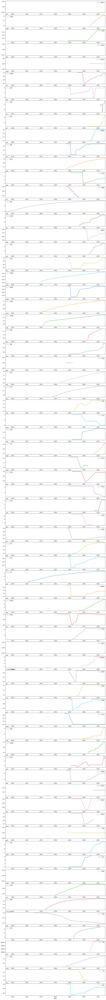

In [119]:
clean_sup_df.supply_circ.unstack().plot(subplots=True, sharex=False, figsize=(15,150));

In [120]:
# bad data
bad_tickers = ['BNB', 'EOS', 'IOST', 'LINA', 'THETA', 'TOMO', 'VET', 'XTZ', 'ZIL']

In [121]:
# drop bad data
clean_sup_df = clean_sup_df.drop(bad_tickers, level=1, axis=0)

### Computing Power:

- Clean computing power data

In [122]:
# concat into one dataframe
cp_df = pd.concat([gn_cp_df, cm_cp_df, cc_cp_df]).dropna(how='all')

In [123]:
# drop duplicates
cp_df = cp_df[~ cp_df.index.duplicated()]

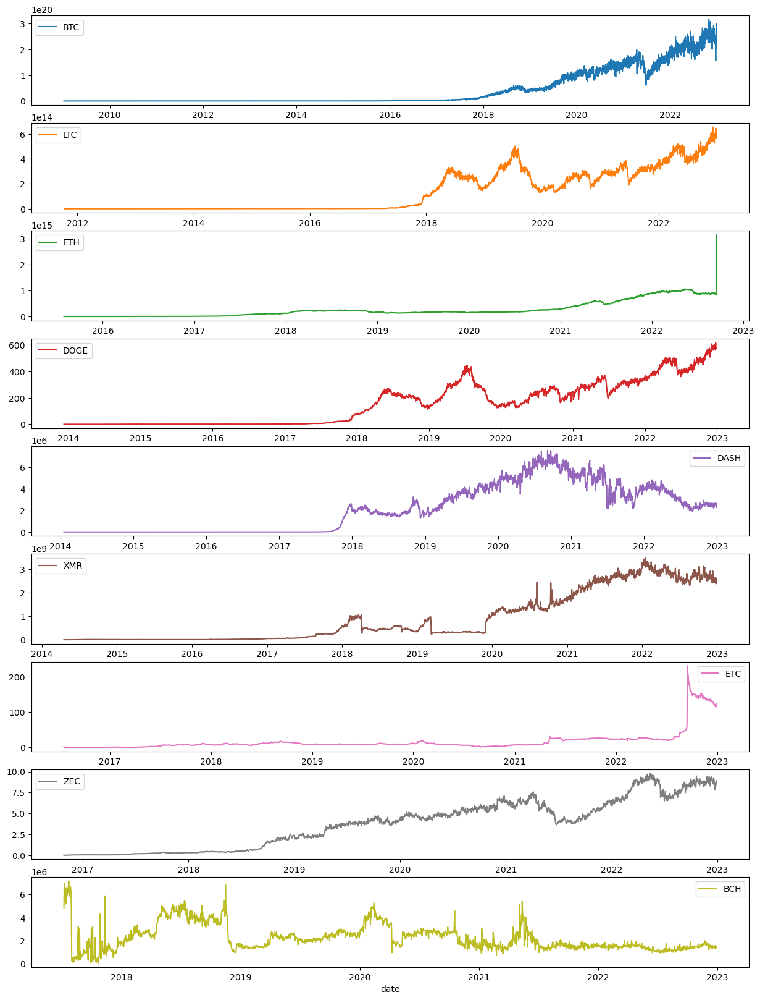

In [124]:
cp_df.hashrate.unstack().plot(subplots=True, sharex=False, figsize=(15,20));

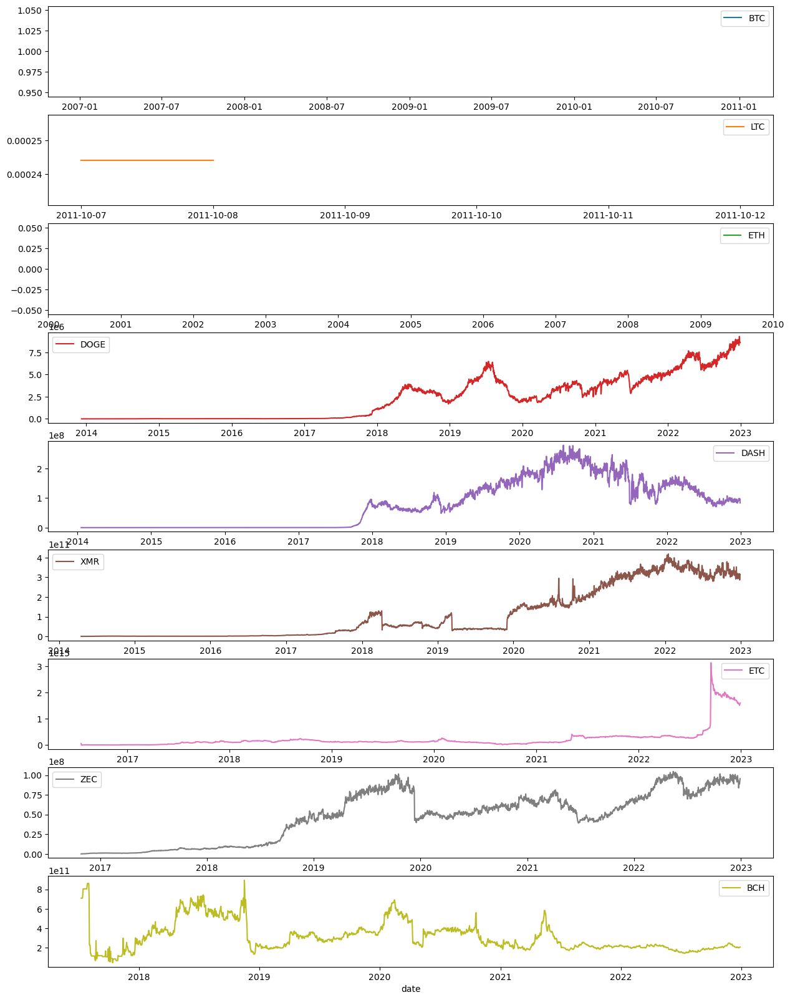

In [125]:
cp_df.diff_mean.unstack().plot(subplots=True, sharex=False, figsize=(15,20));

In [129]:
oc_df = pd.concat([clean_tx_df, clean_add_df, clean_sup_df, cp_df], axis=1).sort_index()

In [130]:
# create csv
oc_df.to_csv('../src/factorlab/datasets/data/crypto_onchain_data.csv')